# Analysing and predicting the income of America 

In [639]:
! pip install missingno
! pip install plotly
# Data wrangling
import pandas as pd 

# Visualization
import matplotlib.pyplot as plt 
import seaborn as sns 

# Date wrangling
import datetime

# Math operations
import numpy as np

# Random sampling
import random
import missingno as msno

from sklearn import svm
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score

import plotly.express as px
import plotly.graph_objects as go

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
pd.set_option('display.float_format', lambda x: f'%.{2}f' % x)
import math
from sklearn.ensemble import RandomForestRegressor

You should consider upgrading via the 'C:\ProgramData\Anaconda3\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'C:\ProgramData\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [640]:
from scipy import stats
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error,explained_variance_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import RidgeCV
from numpy import arange

from sklearn import svm
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score

In [641]:
df = pd.read_csv('E:/st.clair college canada/semester 4th/DAB402_Capstone project/US_CENSUS_DATA_2015.csv')
df = df.loc[df['TotalPop'] > 0] # Filter out data where TotalPopulation is > 0 in the dataset 
df.drop(['IncomeErr','IncomePerCap','IncomePerCapErr'], axis=1, inplace=True) #we already have 'INCOME' attribute
df.head()

,CensusTract,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Income,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001020100,Alabama,Autauga,1948,940,1008,0.90,87.40,7.70,0.30,0.60,0.00,1503,61838.00,8.10,8.40,34.70,17.00,21.30,11.90,15.20,90.20,4.80,0.00,0.50,2.30,2.10,25.00,943,77.10,18.30,4.60,0.00,5.40
1,1001020200,Alabama,Autauga,2156,1059,1097,0.80,40.40,53.30,0.00,2.30,0.00,1662,32303.00,25.50,40.30,22.30,24.70,21.50,9.40,22.00,86.30,13.10,0.00,0.00,0.70,0.00,23.40,753,77.00,16.90,6.10,0.00,13.30
2,1001020300,Alabama,Autauga,2968,1364,1604,0.00,74.50,18.60,0.50,1.40,0.30,2335,44922.00,12.70,19.70,31.40,24.90,22.10,9.20,12.40,94.80,2.80,0.00,0.00,0.00,2.50,19.60,1373,64.10,23.60,12.30,0.00,6.20
3,1001020400,Alabama,Autauga,4423,2172,2251,10.50,82.80,3.70,1.60,0.00,0.00,3306,54329.00,2.10,1.60,27.00,20.80,27.00,8.70,16.40,86.60,9.10,0.00,0.00,2.60,1.60,25.30,1782,75.70,21.20,3.10,0.00,10.80
4,1001020500,Alabama,Autauga,10763,4922,5841,0.70,68.50,24.80,0.00,3.80,0.00,7666,51965.00,11.40,17.50,49.60,14.20,18.20,2.10,15.80,88.00,10.50,0.00,0.00,0.60,0.90,24.80,5037,67.10,27.60,5.30,0.00,4.20


## Dataset information 

In [642]:
# Finding the input dataset size and shape
df.shape

(73311, 34)

In [643]:
# show the data types of attributes 
df.dtypes

CensusTract       int64
State            object
County           object
TotalPop          int64
Men               int64
Women             int64
Hispanic        float64
White           float64
Black           float64
Native          float64
Asian           float64
Pacific         float64
Citizen           int64
Income          float64
Poverty         float64
ChildPoverty    float64
Professional    float64
Service         float64
Office          float64
Construction    float64
Production      float64
Drive           float64
Carpool         float64
Transit         float64
Walk            float64
OtherTransp     float64
WorkAtHome      float64
MeanCommute     float64
Employed          int64
PrivateWork     float64
PublicWork      float64
SelfEmployed    float64
FamilyWork      float64
Unemployment    float64
dtype: object

In [644]:
# checking data types for all 
#Descriptive Analytics of quantitative variables in the dataframe
df_census = round(df.describe(),0)  # rounding off the decimals
#df_census.T # transposing the data
#df_census.to_csv("df_census.csv") # Printing the descriptive Statistics for the Numerical fields in dataframe
#df.T # transposing the data
#df.to_csv("df.csv")

In [645]:
df.dtypes

CensusTract       int64
State            object
County           object
TotalPop          int64
Men               int64
Women             int64
Hispanic        float64
White           float64
Black           float64
Native          float64
Asian           float64
Pacific         float64
Citizen           int64
Income          float64
Poverty         float64
ChildPoverty    float64
Professional    float64
Service         float64
Office          float64
Construction    float64
Production      float64
Drive           float64
Carpool         float64
Transit         float64
Walk            float64
OtherTransp     float64
WorkAtHome      float64
MeanCommute     float64
Employed          int64
PrivateWork     float64
PublicWork      float64
SelfEmployed    float64
FamilyWork      float64
Unemployment    float64
dtype: object

In [646]:
#checking the missing values in each attributes
df.isnull().sum()

CensusTract       0
State             0
County            0
TotalPop          0
Men               0
Women             0
Hispanic          0
White             0
Black             0
Native            0
Asian             0
Pacific           0
Citizen           0
Income          410
Poverty         145
ChildPoverty    428
Professional    117
Service         117
Office          117
Construction    117
Production      117
Drive           107
Carpool         107
Transit         107
Walk            107
OtherTransp     107
WorkAtHome      107
MeanCommute     259
Employed          0
PrivateWork     117
PublicWork      117
SelfEmployed    117
FamilyWork      117
Unemployment    112
dtype: int64

In [647]:
df.nunique()

CensusTract     73311
State              52
County           1928
TotalPop         9611
Men              5591
Women            5667
Hispanic         1001
White            1001
Black            1000
Native            463
Asian             764
Pacific           178
Citizen          7250
Income          41562
Poverty           845
ChildPoverty      960
Professional      864
Service           603
Office            493
Construction      490
Production        501
Drive             979
Carpool           429
Transit           832
Walk              606
OtherTransp       295
WorkAtHome        372
MeanCommute       529
Employed         5507
PrivateWork       690
PublicWork        650
SelfEmployed      331
FamilyWork         73
Unemployment      491
dtype: int64

In [648]:
df.info() #check the detail information of my dataset

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73311 entries, 0 to 74000
Data columns (total 34 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   CensusTract   73311 non-null  int64  
 1   State         73311 non-null  object 
 2   County        73311 non-null  object 
 3   TotalPop      73311 non-null  int64  
 4   Men           73311 non-null  int64  
 5   Women         73311 non-null  int64  
 6   Hispanic      73311 non-null  float64
 7   White         73311 non-null  float64
 8   Black         73311 non-null  float64
 9   Native        73311 non-null  float64
 10  Asian         73311 non-null  float64
 11  Pacific       73311 non-null  float64
 12  Citizen       73311 non-null  int64  
 13  Income        72901 non-null  float64
 14  Poverty       73166 non-null  float64
 15  ChildPoverty  72883 non-null  float64
 16  Professional  73194 non-null  float64
 17  Service       73194 non-null  float64
 18  Office        73194 non-nu

<AxesSubplot:>

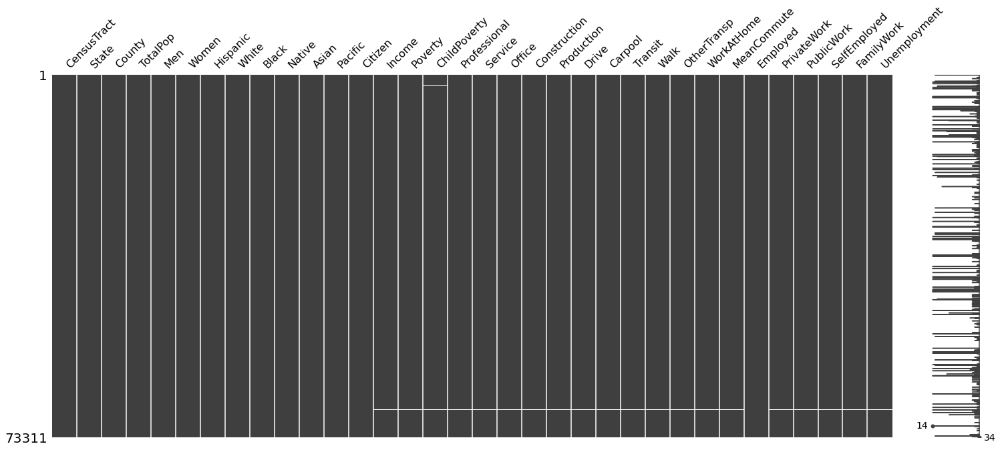

In [649]:
msno.matrix(df) # show the matrix of missing values 

<AxesSubplot:>

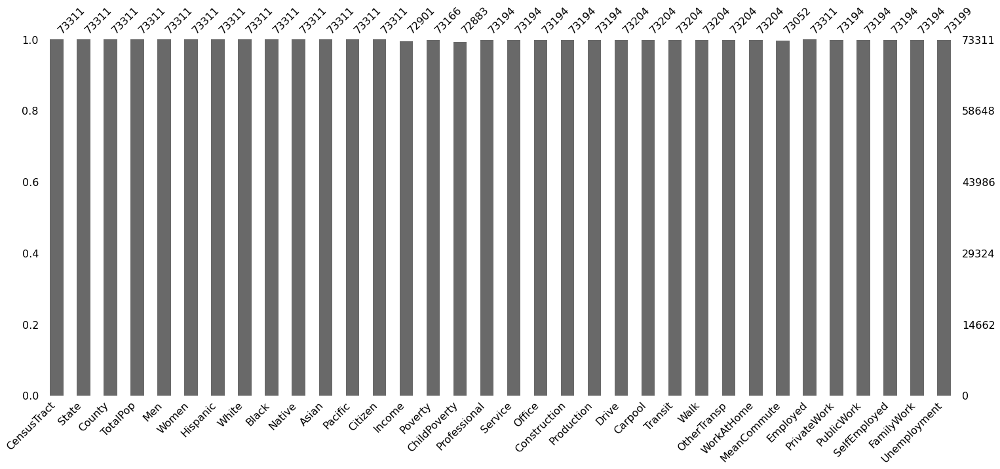

In [650]:
msno.bar(df)

In [651]:
df.columns

Index(['CensusTract', 'State', 'County', 'TotalPop', 'Men', 'Women',
       'Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific', 'Citizen',
       'Income', 'Poverty', 'ChildPoverty', 'Professional', 'Service',
       'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit',
       'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute', 'Employed',
       'PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork',
       'Unemployment'],
      dtype='object')

## drop the rows  which have entire rows missing

In [652]:
df.dropna(axis=0, inplace=True)
df.reset_index(drop=True, inplace=True) # drop the rows  which have entire rows missing
df.head()

,CensusTract,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Income,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001020100,Alabama,Autauga,1948,940,1008,0.90,87.40,7.70,0.30,0.60,0.00,1503,61838.00,8.10,8.40,34.70,17.00,21.30,11.90,15.20,90.20,4.80,0.00,0.50,2.30,2.10,25.00,943,77.10,18.30,4.60,0.00,5.40
1,1001020200,Alabama,Autauga,2156,1059,1097,0.80,40.40,53.30,0.00,2.30,0.00,1662,32303.00,25.50,40.30,22.30,24.70,21.50,9.40,22.00,86.30,13.10,0.00,0.00,0.70,0.00,23.40,753,77.00,16.90,6.10,0.00,13.30
2,1001020300,Alabama,Autauga,2968,1364,1604,0.00,74.50,18.60,0.50,1.40,0.30,2335,44922.00,12.70,19.70,31.40,24.90,22.10,9.20,12.40,94.80,2.80,0.00,0.00,0.00,2.50,19.60,1373,64.10,23.60,12.30,0.00,6.20
3,1001020400,Alabama,Autauga,4423,2172,2251,10.50,82.80,3.70,1.60,0.00,0.00,3306,54329.00,2.10,1.60,27.00,20.80,27.00,8.70,16.40,86.60,9.10,0.00,0.00,2.60,1.60,25.30,1782,75.70,21.20,3.10,0.00,10.80
4,1001020500,Alabama,Autauga,10763,4922,5841,0.70,68.50,24.80,0.00,3.80,0.00,7666,51965.00,11.40,17.50,49.60,14.20,18.20,2.10,15.80,88.00,10.50,0.00,0.00,0.60,0.90,24.80,5037,67.10,27.60,5.30,0.00,4.20


In [653]:
df.isnull().sum() # check the missing values after dropping the missing rows

CensusTract     0
State           0
County          0
TotalPop        0
Men             0
Women           0
Hispanic        0
White           0
Black           0
Native          0
Asian           0
Pacific         0
Citizen         0
Income          0
Poverty         0
ChildPoverty    0
Professional    0
Service         0
Office          0
Construction    0
Production      0
Drive           0
Carpool         0
Transit         0
Walk            0
OtherTransp     0
WorkAtHome      0
MeanCommute     0
Employed        0
PrivateWork     0
PublicWork      0
SelfEmployed    0
FamilyWork      0
Unemployment    0
dtype: int64

## Check the missing values by using msno matrix , so we can say that our data cleaned now.

<AxesSubplot:>

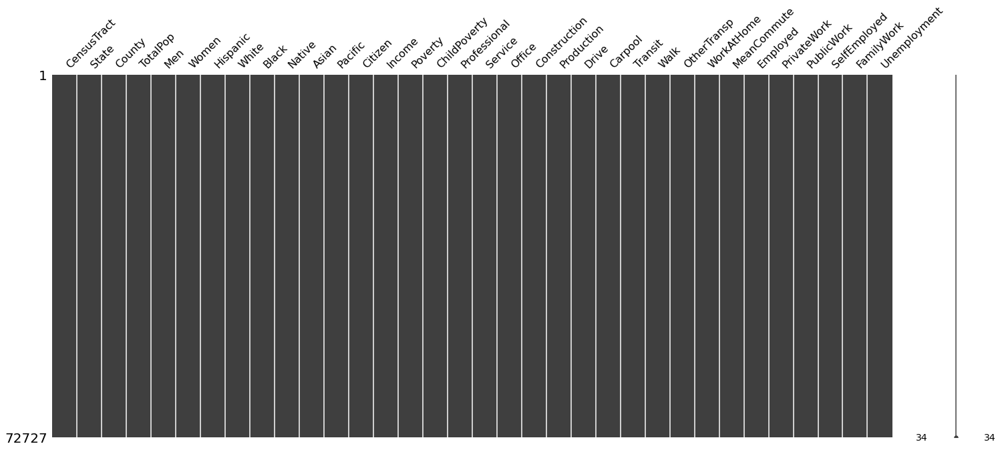

In [654]:
msno.matrix(df) 

In [655]:
df.shape                         #again check the shape of dataset

(72727, 34)

In [692]:
df.describe() 
df.T                         # transposing the data
df.to_csv("df.csv")         # Printing the descriptive Statistics for the Numerical fields in dataframe

In [657]:
#Check the rows where the Total Pop =0
df.loc[df['TotalPop'] == 0]

,CensusTract,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Income,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment


### Exploring the columns where the values are in totals.

In [658]:
df1=df[["TotalPop","Men","Women","Citizen","Employed"]].head()
df1.head()
#df1.T # transposing the data
#df1.to_csv("df1.csv")

,TotalPop,Men,Women,Citizen,Employed
0,1948,940,1008,1503,943
1,2156,1059,1097,1662,753
2,2968,1364,1604,2335,1373
3,4423,2172,2251,3306,1782
4,10763,4922,5841,7666,5037


## Convert the columns into percentage 

In [659]:
df['Men'] = (df['Men']/df['TotalPop'])*100
df['Women'] = (df['Women']/df['TotalPop'])*100
df['Citizen'] = (df['Citizen']/df['TotalPop'])*100
df['Employed'] = (df['Employed']/df['TotalPop'])*100

In [660]:
df.head(5)

,CensusTract,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Income,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001020100,Alabama,Autauga,1948,48.25,51.75,0.90,87.40,7.70,0.30,0.60,0.00,77.16,61838.00,8.10,8.40,34.70,17.00,21.30,11.90,15.20,90.20,4.80,0.00,0.50,2.30,2.10,25.00,48.41,77.10,18.30,4.60,0.00,5.40
1,1001020200,Alabama,Autauga,2156,49.12,50.88,0.80,40.40,53.30,0.00,2.30,0.00,77.09,32303.00,25.50,40.30,22.30,24.70,21.50,9.40,22.00,86.30,13.10,0.00,0.00,0.70,0.00,23.40,34.93,77.00,16.90,6.10,0.00,13.30
2,1001020300,Alabama,Autauga,2968,45.96,54.04,0.00,74.50,18.60,0.50,1.40,0.30,78.67,44922.00,12.70,19.70,31.40,24.90,22.10,9.20,12.40,94.80,2.80,0.00,0.00,0.00,2.50,19.60,46.26,64.10,23.60,12.30,0.00,6.20
3,1001020400,Alabama,Autauga,4423,49.11,50.89,10.50,82.80,3.70,1.60,0.00,0.00,74.75,54329.00,2.10,1.60,27.00,20.80,27.00,8.70,16.40,86.60,9.10,0.00,0.00,2.60,1.60,25.30,40.29,75.70,21.20,3.10,0.00,10.80
4,1001020500,Alabama,Autauga,10763,45.73,54.27,0.70,68.50,24.80,0.00,3.80,0.00,71.23,51965.00,11.40,17.50,49.60,14.20,18.20,2.10,15.80,88.00,10.50,0.00,0.00,0.60,0.90,24.80,46.80,67.10,27.60,5.30,0.00,4.20


### Drop the ‘TotalPop’,  and ‘Employed’ attributes as well from our dataset because total population is always sum of MEN+WOMEN population and in the case of ‘Employed’ attribute, we have detail of different occupations in the different attributes such as 'Professional', 'Service', 'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'Other Transp', 'Work At Home', 'Mean Commute', 'PrivateWork','PublicWork', 'SelfEmployed', 'FamilyWork'. So we dropped the Employed attributes from our dataset.

In [606]:
df.drop(['TotalPop','Employed'], axis=1, inplace=True) 

In [607]:
df.columns

Index(['CensusTract', 'State', 'County', 'Men', 'Women', 'Hispanic', 'White',
       'Black', 'Native', 'Asian', 'Pacific', 'Citizen', 'Income', 'Poverty',
       'ChildPoverty', 'Professional', 'Service', 'Office', 'Construction',
       'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp',
       'WorkAtHome', 'MeanCommute', 'PrivateWork', 'PublicWork',
       'SelfEmployed', 'FamilyWork', 'Unemployment'],
      dtype='object')

In [608]:
cols = list(df.columns.values)
cols.pop(cols.index('Income')) 
df = df[cols+['Income']]                   #make the target variable at last
df.head()

,CensusTract,State,County,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
0,1001020100,Alabama,Autauga,48.25,51.75,0.90,87.40,7.70,0.30,0.60,0.00,77.16,8.10,8.40,34.70,17.00,21.30,11.90,15.20,90.20,4.80,0.00,0.50,2.30,2.10,25.00,77.10,18.30,4.60,0.00,5.40,61838.00
1,1001020200,Alabama,Autauga,49.12,50.88,0.80,40.40,53.30,0.00,2.30,0.00,77.09,25.50,40.30,22.30,24.70,21.50,9.40,22.00,86.30,13.10,0.00,0.00,0.70,0.00,23.40,77.00,16.90,6.10,0.00,13.30,32303.00
2,1001020300,Alabama,Autauga,45.96,54.04,0.00,74.50,18.60,0.50,1.40,0.30,78.67,12.70,19.70,31.40,24.90,22.10,9.20,12.40,94.80,2.80,0.00,0.00,0.00,2.50,19.60,64.10,23.60,12.30,0.00,6.20,44922.00
3,1001020400,Alabama,Autauga,49.11,50.89,10.50,82.80,3.70,1.60,0.00,0.00,74.75,2.10,1.60,27.00,20.80,27.00,8.70,16.40,86.60,9.10,0.00,0.00,2.60,1.60,25.30,75.70,21.20,3.10,0.00,10.80,54329.00
4,1001020500,Alabama,Autauga,45.73,54.27,0.70,68.50,24.80,0.00,3.80,0.00,71.23,11.40,17.50,49.60,14.20,18.20,2.10,15.80,88.00,10.50,0.00,0.00,0.60,0.90,24.80,67.10,27.60,5.30,0.00,4.20,51965.00


## PART 2: Data Exploratory (EDA)

## Percentage  of American by Race

In [666]:
df.columns


Index(['CensusTract', 'State', 'County', 'TotalPop', 'Men', 'Women',
       'Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific', 'Citizen',
       'Income', 'Poverty', 'ChildPoverty', 'Professional', 'Service',
       'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit',
       'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute', 'Employed',
       'PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork',
       'Unemployment'],
      dtype='object')

### Lets see how many of people work is in the US as a percentage of the total 

<AxesSubplot:title={'center':'Percentage of Americans by work'}>

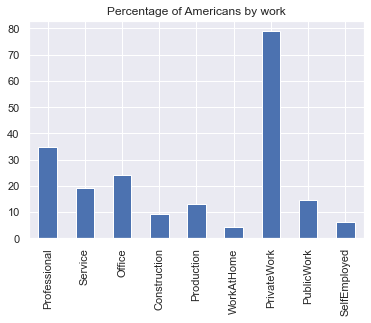

In [668]:

occu_columns = ['Professional', 'Service',
       'Office', 'Construction', 'Production','WorkAtHome',
       'PrivateWork', 'PublicWork', 'SelfEmployed']
census_occu = df[occu_columns]

(census_occu.sum()/len(census_occu)).plot.bar(title = "Percentage of Americans by work")

## correlations between races and poverty

<AxesSubplot:>

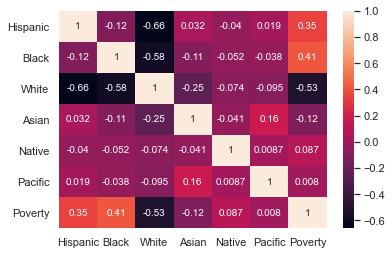

In [669]:
Corr_race = ( df.loc[:, ['Hispanic', 'Black', 'White', 'Asian', 'Native','Pacific','Poverty']]).corr()

sns.heatmap(Corr_race, annot=True)

### Here is a heatmap to see correlations between races and poverty. If you focus on the right-most column, you'll see which races are most correlated with poverty. Hispanic is the most, and white is the least. The most strongly negatively correlated features are between hispanics and whites, so the more hispanics you have the less whites you have., and the second most strongly correlated feature is whites and poverty.

###  There is a negative correlation between hispanic and black areas interestingly

### Lets see how many of each race is in the US as a percentage of the total 

<AxesSubplot:title={'center':'Percentage of Americans by Race'}>

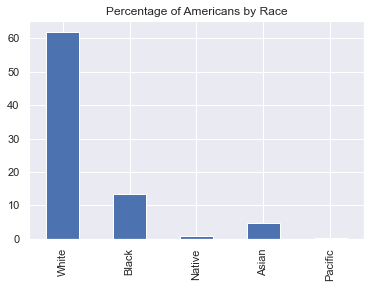

In [685]:
race_columns = ['White','Black','Native','Asian','Pacific']
census_races = df[race_columns]

(census_races.sum()/len(census_races)).plot.bar(title = "Percentage of Americans by Race")

There are more white people than black people as expected

## Lets see Poverty level with Race population in US 

### 1. Poverty Level with White people 

<AxesSubplot:title={'center':'Percentage of white  Americans by poverty'}>

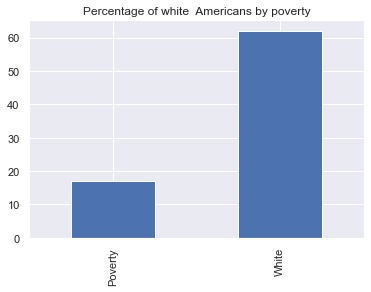

In [686]:
pov_columns = ['Poverty','White']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of white  Americans by poverty")

### 2. Poverty Level with Black people 

<AxesSubplot:title={'center':'Percentage of Black  Americans by poverty'}>

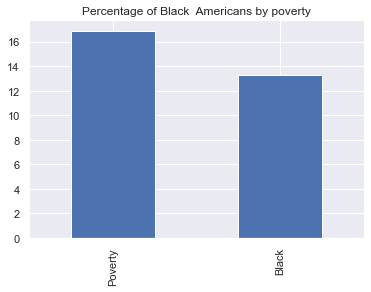

In [682]:
pov_columns = ['Poverty','Black']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of Black  Americans by poverty")

### 3. Poverty Level with Asian people 

<AxesSubplot:title={'center':'Percentage of Asian  Americans by poverty'}>

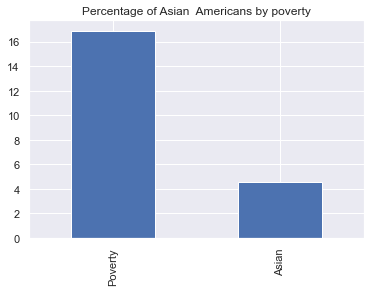

In [683]:
#Lets see how many of each race is in the US as a percentage of the total 
pov_columns = ['Poverty','Asian']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of Asian  Americans by poverty")

### 4. Poverty Level with Hispanic people 

<AxesSubplot:title={'center':'Percentage of Hispanic  Americans by poverty'}>

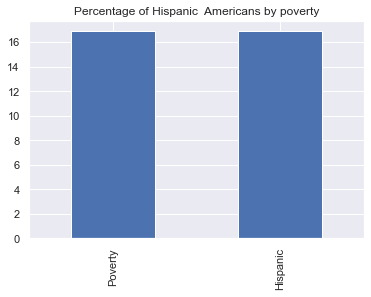

In [687]:
#Lets see how many of each race is in the US as a percentage of the total 
pov_columns = ['Poverty','Hispanic']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of Hispanic  Americans by poverty")

In [610]:
corr = df.corr()['Income'].abs()
fig = px.bar(corr, x=corr.index.values, y=corr.values)

fig.update_layout(
    title="Correlation with Income",
    xaxis_title="Features",
    yaxis_title="Correlation values",
    legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)


fig.show()

In [612]:
columns_to_drop = corr[corr < 0.1].index.values           #based on pearson correlation
df.drop(columns_to_drop, axis=1, inplace=True)

In [613]:
corr = df.corr()['Income'].abs()
fig = px.bar(corr, x=corr.index.values, y=corr.values)

fig.update_layout(
    title="Correlation with Income",
    xaxis_title="Features",
    yaxis_title="Correlation values",
    legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)

fig.show()

## Spearman correlation method

In [614]:
corr1 = df.corr(method='spearman').round(2)
corr1

,Hispanic,White,Black,Asian,Poverty,ChildPoverty,Professional,Service,Construction,Production,Carpool,Walk,OtherTransp,WorkAtHome,MeanCommute,Unemployment,Income
Hispanic,1.00,-0.65,0.09,0.27,0.23,0.20,-0.20,0.24,0.10,-0.02,0.20,0.08,0.16,-0.10,0.11,0.20,-0.10
White,-0.65,1.00,-0.57,-0.23,-0.47,-0.42,0.30,-0.41,0.06,-0.05,-0.21,-0.09,-0.14,0.25,-0.15,-0.43,0.33
Black,0.09,-0.57,1.00,0.08,0.33,0.30,-0.17,0.28,-0.17,0.07,0.07,-0.00,0.04,-0.25,0.02,0.32,-0.28
Asian,0.27,-0.23,0.08,1.00,-0.27,-0.30,0.40,-0.17,-0.38,-0.41,-0.11,0.02,0.09,0.16,0.13,-0.17,0.41
Poverty,0.23,-0.47,0.33,-0.27,1.00,0.90,-0.64,0.61,0.23,0.42,0.29,0.28,0.17,-0.34,-0.16,0.59,-0.87
ChildPoverty,0.20,-0.42,0.30,-0.30,0.90,1.00,-0.64,0.56,0.27,0.45,0.30,0.19,0.11,-0.34,-0.12,0.55,-0.78
Professional,-0.20,0.30,-0.17,0.40,-0.64,-0.64,1.00,-0.66,-0.55,-0.72,-0.40,-0.09,-0.03,0.45,0.05,-0.50,0.72
Service,0.24,-0.41,0.28,-0.17,0.61,0.56,-0.66,1.00,0.18,0.28,0.27,0.22,0.12,-0.33,-0.09,0.47,-0.63
Construction,0.10,0.06,-0.17,-0.38,0.23,0.27,-0.55,0.18,1.00,0.42,0.32,-0.04,-0.04,-0.19,0.05,0.16,-0.30
Production,-0.02,-0.05,0.07,-0.41,0.42,0.45,-0.72,0.28,0.42,1.00,0.32,-0.00,-0.05,-0.39,-0.08,0.32,-0.51


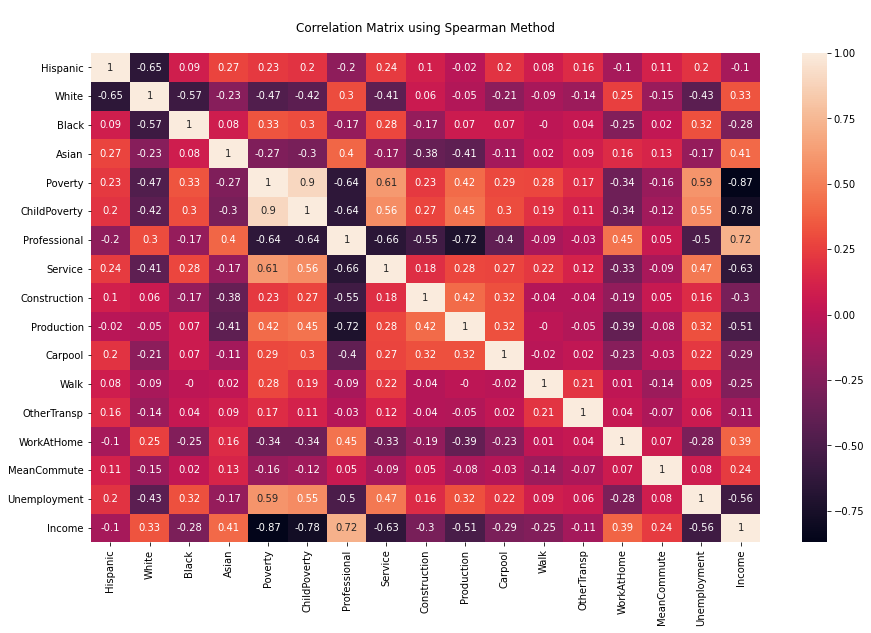

In [615]:
# plotting the correlation matrix
plt.figure(figsize=(15,9))
correlation_mat = df.corr(method='spearman').round(2)

sns.heatmap(correlation_mat, annot = True)
plt.title("\nCorrelation Matrix using Spearman Method\n")
plt.savefig("corr.png",bbox_inches='tight')
plt.show()

## Correlation Matrix using Pearson Method

In [616]:
corr= df.corr().round(2)
corr                            # Pearson Method of correlation 

,Hispanic,White,Black,Asian,Poverty,ChildPoverty,Professional,Service,Construction,Production,Carpool,Walk,OtherTransp,WorkAtHome,MeanCommute,Unemployment,Income
Hispanic,1.00,-0.66,-0.12,0.03,0.35,0.32,-0.34,0.29,0.27,0.13,0.27,0.02,0.12,-0.15,0.12,0.23,-0.23
White,-0.66,1.00,-0.58,-0.25,-0.53,-0.50,0.35,-0.47,-0.04,-0.13,-0.26,-0.07,-0.14,0.24,-0.21,-0.50,0.31
Black,-0.12,-0.58,1.00,-0.11,0.41,0.41,-0.25,0.38,-0.13,0.14,0.07,0.01,0.03,-0.21,0.11,0.48,-0.31
Asian,0.03,-0.25,-0.11,1.00,-0.12,-0.16,0.27,-0.08,-0.24,-0.22,-0.01,0.11,0.05,0.05,0.19,-0.11,0.28
Poverty,0.35,-0.53,0.41,-0.12,1.00,0.90,-0.55,0.59,0.17,0.33,0.27,0.29,0.21,-0.25,-0.11,0.65,-0.70
ChildPoverty,0.32,-0.50,0.41,-0.16,0.90,1.00,-0.57,0.56,0.21,0.38,0.28,0.15,0.15,-0.26,-0.09,0.60,-0.66
Professional,-0.34,0.35,-0.25,0.27,-0.55,-0.57,1.00,-0.66,-0.55,-0.69,-0.41,0.05,-0.00,0.42,0.05,-0.46,0.73
Service,0.29,-0.47,0.38,-0.08,0.59,0.56,-0.66,1.00,0.11,0.21,0.25,0.16,0.13,-0.28,-0.04,0.48,-0.59
Construction,0.27,-0.04,-0.13,-0.24,0.17,0.21,-0.55,0.11,1.00,0.32,0.35,-0.12,-0.02,-0.16,0.03,0.10,-0.33
Production,0.13,-0.13,0.14,-0.22,0.33,0.38,-0.69,0.21,0.32,1.00,0.32,-0.11,-0.04,-0.34,-0.08,0.28,-0.50


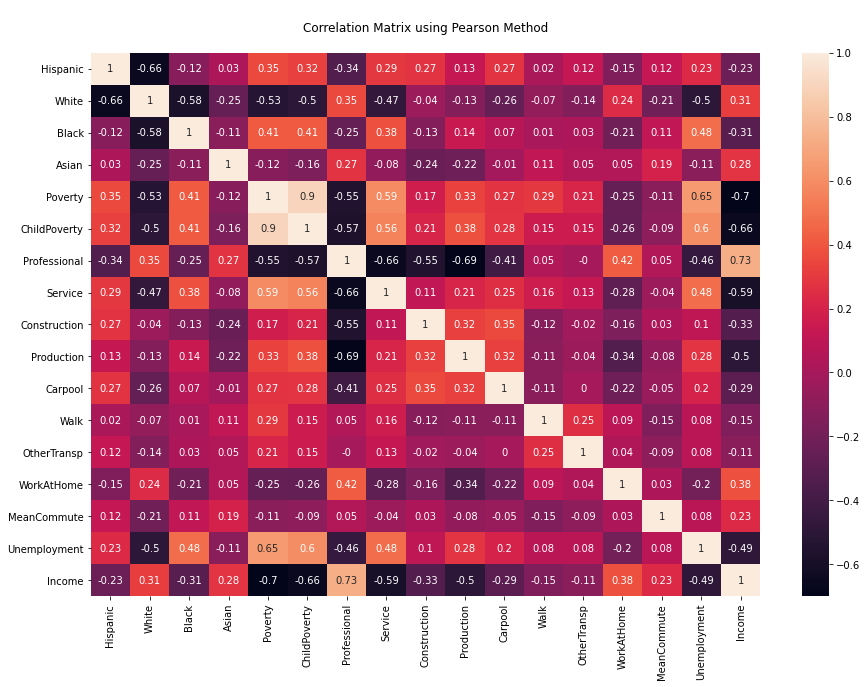

In [617]:
# plotting the correlation matrix
plt.figure(figsize=(15,10))
correlation_mat = df.corr().round(2)

sns.heatmap(correlation_mat, annot = True)
plt.title("\nCorrelation Matrix using Pearson Method\n")
#plt.savefig("corr.png",bbox_inches='tight')
plt.show()

In [675]:
avg_state_income = df.groupby(['State'])['Income'].mean() # average income of each state 

fig = px.bar(avg_state_income, x=avg_state_income.index.values, y=avg_state_income.values, title="Average State Income")


fig.update_layout(
    title="Average State Income",
    xaxis_title="State",
    yaxis_title="Avg Income",
    legend_title="Legend Title",
    font=dict(
        family="serif, monospace",
        color="Red"
    )
)

fig.show()

In [619]:
fig = px.box(df, x="State", y="Income")

fig.update_layout(
    title="Box Plot for Income of different States",
#     xaxis_title="State",
#     yaxis_title="Avg Income",
#     legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)


fig.show()

In [620]:
fig = px.histogram(df, x="Income", color="State", nbins=100)
fig.show()

In [621]:
fig = px.histogram(df, x="State", y="Income", nbins=100)
fig.show()

In [622]:
# fig = px.pie(df, values='Income', names='State')
# # fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))
# fig.show()

In [689]:
fig = px.pie(df, values='Income', names='State',
             title='Income of different states')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))
# fig.update_layout(uniformtext_minsize=20, uniformtext_mode='hide')
fig.show()

In [691]:
avg_state_GDP = df.groupby(['State'])['Income'].sum()/df.groupby(['State'])['TotalPop'].mean()

fig = px.bar(avg_state_GDP, x=avg_state_GDP.index.values, y=avg_state_GDP.values, title="Average State Population")


fig.update_layout(
    title="Average State GDP",
    xaxis_title="State",
    yaxis_title="Avg GDP",
    legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)

fig.show()

In [624]:
income1= df.corr()['Income'].abs().sort_values(ascending=False)
income1
#income1.to_csv("income1.csv",index=True)

Income         1.00
Professional   0.73
Poverty        0.70
ChildPoverty   0.66
Service        0.59
Production     0.50
Unemployment   0.49
WorkAtHome     0.38
Construction   0.33
White          0.31
Black          0.31
Carpool        0.29
Asian          0.28
MeanCommute    0.23
Hispanic       0.23
Walk           0.15
OtherTransp    0.11
Name: Income, dtype: float64

its shows that professional, poverty, child poverty, service and production gives the satisfying correlation with INCOME 

In [625]:
cols = list(df.describe().columns)
# cols.pop(cols.index('CensusTract'))

## Model development

### Normalizing our attributes  using min max scaler 

In [626]:

# y = (y- min_value)/(max_value - min_value )
minimum = []
maximum = []

minimum.append(df['Income'].min())
maximum.append(df['Income'].max())

scaler = MinMaxScaler(feature_range=(0, 1))
df[cols] = scaler.fit_transform(df[cols])

df.head()

,State,County,Hispanic,White,Black,Asian,Poverty,ChildPoverty,Professional,Service,Construction,Production,Carpool,Walk,OtherTransp,WorkAtHome,MeanCommute,Unemployment,Income
0,Alabama,Autauga,0.01,0.87,0.08,0.01,0.08,0.08,0.35,0.23,0.17,0.25,0.09,0.01,0.04,0.02,0.31,0.08,0.24
1,Alabama,Autauga,0.01,0.40,0.53,0.03,0.26,0.40,0.22,0.33,0.14,0.37,0.23,0.00,0.01,0.00,0.28,0.19,0.12
2,Alabama,Autauga,0.00,0.74,0.19,0.02,0.13,0.20,0.31,0.34,0.13,0.21,0.05,0.00,0.00,0.03,0.22,0.09,0.17
3,Alabama,Autauga,0.10,0.83,0.04,0.00,0.02,0.02,0.27,0.28,0.13,0.27,0.16,0.00,0.04,0.02,0.31,0.16,0.21
4,Alabama,Autauga,0.01,0.69,0.25,0.04,0.12,0.18,0.50,0.19,0.03,0.26,0.19,0.00,0.01,0.01,0.30,0.06,0.20


In [627]:
df.describe()

,Hispanic,White,Black,Asian,Poverty,ChildPoverty,Professional,Service,Construction,Production,Carpool,Walk,OtherTransp,WorkAtHome,MeanCommute,Unemployment,Income
count,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00
mean,0.17,0.62,0.13,0.05,0.17,0.22,0.35,0.26,0.13,0.21,0.17,0.03,0.03,0.05,0.32,0.13,0.22
std,0.23,0.31,0.22,0.10,0.13,0.19,0.15,0.11,0.09,0.13,0.09,0.06,0.04,0.04,0.11,0.08,0.12
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.02,0.39,0.01,0.00,0.07,0.07,0.24,0.18,0.07,0.12,0.11,0.00,0.01,0.02,0.24,0.07,0.14
50%,0.07,0.71,0.04,0.02,0.14,0.18,0.33,0.24,0.12,0.20,0.16,0.02,0.02,0.04,0.31,0.11,0.20
75%,0.21,0.88,0.14,0.05,0.23,0.34,0.44,0.32,0.18,0.29,0.22,0.04,0.04,0.07,0.38,0.16,0.27
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


## Split the data into train test split

In [628]:
X = df.iloc[:,2:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
print("The shape of X_train = ", X_train.shape)
print("The shape of y_train= ", y_train.shape)
print("The shape of X_test= ", X_test.shape)
print("The shape of y_test= ", y_test.shape)

The shape of X_train =  (58181, 16)
The shape of y_train=  (58181,)
The shape of X_test=  (14546, 16)
The shape of y_test=  (14546,)


### Decision Tree Regression

In [629]:
from sklearn.tree import DecisionTreeRegressor
X = df.iloc[:,2:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

 #Build the random forest regressor model

DTree = DecisionTreeRegressor(random_state=0)
#Train the random forest regression model to dataset
model = DTree.fit(X_train,y_train)

   #Predict on test features
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

  # evaluate model metrics

mse = mean_squared_error(y_test, y_pred)
r2_dtree = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

 
print("R2 score                = %.4f" % r2_dtree)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")


--------------------------------------------------

R2 score                = 0.6465
Explained Variance score= 0.6466
Mean absolute error     = 11503.8923
Mean squared error      = 287209838.8521
Root Mean squared error = 16947.2664

--------------------------------------------------



### Linear Regression

In [630]:
X = df.iloc[:,2:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
#Build the linear regression model
lr = LinearRegression()
model = lr.fit(X_train,y_train)
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

mse = mean_squared_error(y_test, y_pred)
r2_LR = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print("R2 score                = %.4f" % r2_LR)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")


--------------------------------------------------

R2 score                = 0.7042
Explained Variance score= 0.7042
Mean absolute error     = 10962.0894
Mean squared error      = 240350924.1336
Root Mean squared error = 15503.2553

--------------------------------------------------



### SUPPORT VECTOR REGRESSION 

In [631]:
X = df.iloc[:,2:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
# Build the Support Vecrtor Regression
model = svm.SVR(kernel='rbf', gamma='scale',C=5).fit(X_train, y_train)
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

mse = mean_squared_error(y_test, y_pred)
r2_SVR = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print("R2 score                = %.4f" % r2_SVR)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")


--------------------------------------------------

R2 score                = 0.8110
Explained Variance score= 0.8264
Mean absolute error     = 9256.4412
Mean squared error      = 153568349.2004
Root Mean squared error = 12392.2697

--------------------------------------------------



### Random Forest Regression 

In [632]:
X = df.iloc[:,2:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

RFModel = RandomForestRegressor(n_estimators = 50, random_state = 42, verbose = 1)
model = RFModel.fit(X_train,y_train)

y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

model_score = RFModel.score(X, y)
mse = mean_squared_error(y_test, y_pred)
r2_random = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print("Model score is          = %.4f" % model_score)
print("R2 score                = %.4f" % r2_random)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   33.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



--------------------------------------------------

Model score is          = 0.9467
R2 score                = 0.8295
Explained Variance score= 0.8296
Mean absolute error     = 8007.8950
Mean squared error      = 138518628.1910
Root Mean squared error = 11769.3937

--------------------------------------------------



[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.9s finished


In [633]:
X = df.iloc[:,2:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

 #Build the random forest regressor model
RFModel = RandomForestRegressor(n_estimators = 100, random_state = 42, verbose = 1)

#Train the random forest regression model to dataset
model = RFModel.fit(X_train,y_train)

   #Predict on test features
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

  # evaluate model metrics
model_score = RFModel.score(X, y) 
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print("Model score is          = %.4f" % model_score)  
print("R2 score                = %.4f" % r2)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



--------------------------------------------------

Model score is          = 0.9480
R2 score                = 0.8315
Explained Variance score= 0.8316
Mean absolute error     = 7964.4376
Mean squared error      = 136920374.7123
Root Mean squared error = 11701.2980

--------------------------------------------------



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    4.1s finished


In [634]:
# Comparing Accuracies

labels =["Decision Tree","linear Regression","SVR", "Random Forest =50","Random Forest=100"]
x = [r2_dtree,r2_LR,r2_SVR,r2_random,r2]
eval_frame=pd.DataFrame()
eval_frame['Model']=labels
eval_frame['Train_test_split'] = x
eval_frame
#eval_frame.to_csv("eval_frame.csv",index=True)

,Model,Train_test_split
0,Decision Tree,0.65
1,linear Regression,0.70
2,SVR,0.81
3,Random Forest =50,0.83
4,Random Forest=100,0.83


In [635]:
from sklearn.preprocessing import PolynomialFeatures

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



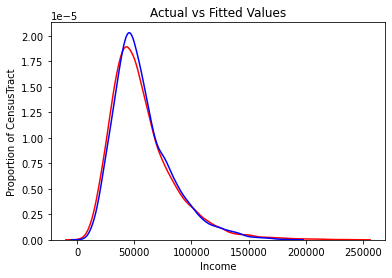

In [636]:
import matplotlib.pyplot as plt
plt.figure()
ax1 = sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred, hist=False, color="b", label="Fitted Values" , ax=ax1)

plt.title('Actual vs Fitted Values')
plt.xlabel('Income')
plt.ylabel('Proportion of CensusTract')

plt.show()
plt.close()